# Import Necessary Library

In [ ]:
#Importing Libraries
import tensorflow as tf
import numpy as np
import pandas as pd
from collections import Counter
import random
import IPython
from IPython.display import Image, Audio
import music21
from music21 import *
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adamax
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
import matplotlib.patches as mpatches
import sys
import warnings
import os
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

In [ ]:
# enables music21 to render images of musical notes
print('installing lilypond...')
!apt-get install lilypond > /dev/null

# converts midi files to wav files into order to play them
print('installing fluidsynth...')
!apt-get install fluidsynth > /dev/null
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

print('installing musescore...')
!apt install musescore3 > /dev/null

print('done!')

installing lilypond...
installing fluidsynth...
installing musescore...


done!


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Data Gathering & Preprocessing

## Gather, Sampling and Key Transposing

In [ ]:
#Loading the list of chopin's midi files as stream
filepath = "/content/drive/MyDrive/ClassicalMusic/chopin/"
#Getting midi files
all_midis= []
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        midi_ut = converter.parse(tr)
        k = midi_ut.analyze('key')
        i = interval.Interval(k.tonic, pitch.Pitch('C'))
        midi_nt = midi_ut.transpose(i)
        midi = midi_nt.stripTies()
        all_midis.append(midi)


Gather all midis file and transpose the key of the all music to middle C

In [ ]:
all_midis = all_midis[:3]

Select 3 only chopin music.

## Music Functions

In [ ]:
def show(music):
  display(Image(str(music.write('lily.png'))))

def play(music):
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 16000 > /dev/null
  display(Audio(str(filename) + '.wav'))

define two functions to produce a music sheet and music audio

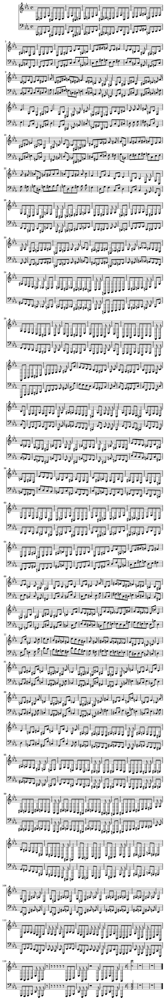

In [ ]:
show(all_midis[1])

In [ ]:
play(all_midis[1])

## Clef Splitting

In [ ]:
def split_part(midis):
  all_midis_parts = []

  for midi in midis:
    for i in range(len(midi.parts)):
      all_midis_parts.append(midi.parts[i])

  return all_midis_parts

split the midi file into parts

In [ ]:
all_midi_split = split_part(all_midis)

In [ ]:
len(all_midi_split)

6

Each of the music composed of two part which is also means two clef. There are total of 3 midi file, so total of the parts is 6.

In [ ]:
def split_clef(midis_parts):
  treble_clef_midi = []
  bass_clef_midi = []

  for midi in midis_parts:
    for element in midi.flat:

      clef_name = None

      if isinstance(element, music21.clef.Clef):
        clef_name = str(element.name)

        if clef_name  == 'treble':
          treble_clef_midi.append(midi)

        elif clef_name == 'bass':
          bass_clef_midi.append(midi)

  return treble_clef_midi, bass_clef_midi


In [ ]:
treble_midis, bass_midis = split_clef(all_midi_split)

Each of the part was looked for their clef property, the part with same clef property will be group together, i.e. part with treble clef property belongs to treble clef while part with bass clef property belongs to bass clef.  

In [ ]:
treble_midis

[<music21.stream.Part 0x7b70bd66a080>,
 <music21.stream.Part 0x7b70bb803ac0>,
 <music21.stream.Part 0x7b70b9cfd1b0>]

In [ ]:
bass_midis

[<music21.stream.Part 0x7b70bd66a830>,
 <music21.stream.Part 0x7b70bb802230>,
 <music21.stream.Part 0x7b70b9cfc640>]

## Duplicates

In [ ]:
duplicates = [element for element in bass_midis if element in treble_midis]
print(duplicates)

[]


No duplicates data

## Music Element Extraction

In [ ]:
def extract_notes_all(midi_clef):

  notes = []
  durations = []
  #types = []
  sequence_num = []

  for midi_part in midi_clef:
    for element in midi_part.flat:
      note_name = None
      duration_name  = None


    #if isinstance(element, music21.key.Key):
    # note_name = str(element.tonic.name) + ':' + str(element.mode)
    #  duration_name = "0.0"

    #elif isinstance(element, music21.meter.TimeSignature):
    #  note_name = str(element.ratioString) + 'TS'
    #  duration_name = "0.0"

      if isinstance(element, music21.chord.Chord):
        note_name = []
        duration_name = []
        for i in element.pitches:
          note_name.append(i.nameWithOctave)
        #note_name = element.pitches[-1].nameWithOctave
        #note_name = element
          #duration_name.append(element.duration.quarterLength)
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Rest):
        note_name = str(element.name)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      elif isinstance(element, music21.note.Note):
        note_name = str(element.nameWithOctave)
        #note_name = element
        duration_name = float(element.duration.quarterLength)

      if note_name and duration_name:
        notes.append(note_name)
        durations.append(duration_name)

  return notes, durations

In [ ]:
bass_midis_element = extract_notes_all(bass_midis)
treble_midis_element = extract_notes_all(treble_midis)

The music element such as notes, chords and durations will be extracted for each clef. Noted that, each music elements of treble and bass clef are remains separated. The notes and chords are grouped together under the same feature while durations itself become another feature.

In [ ]:
bass_midis_element

(['C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'G1',
  'C#3',
  'E3',
  'D3',
  'F3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'G1',
  'C#3',
  'E3',
  'D3',
  'F3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'A1',
  'E-3',
  'F#3',
  'E3',
  'A3',
  'C3',
  'D2',
  'C#3',
  'E3',
  'D3',
  'G3',
  'B2',
  'rest',
  'D2',
  'C#3',
  'E3',
  'D3',
  'F#3',
  'A2',
  'G2',
  'C#3',
  'E3',
  'D3',
  'G3',
  'B2',
  'D3',
  'C3',
  'F3',
  'A2',
  'C3',
  'B2',
  'E3',
  'G2',
  'E3',
  'F2',
  'E3',
  'D3',
  'rest',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'C2',
  'B2',
  'D3',
  'C3',
  'E3',
  'G2',
  'G1',
  'C#3',
  'E3',
  'D3',
  'F3',
  'G2',
  'C2',
  '

In [ ]:
len(bass_midis_element[0])

1852

In [ ]:
len(bass_midis_element[1])

1852

In [ ]:
treble_midis_element

([['G3', 'C4', 'E4'],
  ['C4', 'G3', 'E4'],
  ['G3', 'E4', 'C4'],
  'rest',
  'B3',
  'F4',
  'D4',
  ['C4', 'E4', 'G3'],
  'rest',
  'G3',
  ['C4', 'E4'],
  ['E4', 'C4'],
  'G3',
  ['E4', 'C4'],
  'rest',
  ['F4', 'D4'],
  ['E4', 'C4'],
  'rest',
  ['B3', 'D4'],
  'rest',
  ['E4', 'C4'],
  'rest',
  'B3',
  ['G4', 'E4'],
  'rest',
  ['F4', 'D4'],
  'rest',
  'rest',
  ['D4', 'G3'],
  ['G3', 'C4', 'E4'],
  ['E4', 'G3', 'G4'],
  ['E4', 'C5', 'C4'],
  'rest',
  ['G4', 'B4', 'D4'],
  ['C4', 'D4'],
  'B4',
  'A4',
  ['C4', 'D4'],
  'rest',
  ['B3', 'G4', 'D4'],
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'rest',
  'E3',
  ['C4', 'E4', 'G3'],
  ['G3', 'C4', 'E4'],
  ['C4', 'E4'],
  'G3',
  'rest',
  ['F4', 'B3'],
  'D4',
  ['C4', 'G3', 'E4'],
  'rest',
  ['G3', 'E4'],
  'C4',
  'rest',
  ['G3', 'E4', 'C4'],
  ['C4', 'E4', 'G3'],
  ['G3', 'C4', 'E4'],
  ['

In [ ]:
len(treble_midis_element[0])

1902

In [ ]:
len(treble_midis_element[1])

1902

## Dataframe Construction

In [ ]:
bass_df = pd.DataFrame(bass_midis_element).T
bass_df.columns = ['music_element', 'duration']
bass_df

,music_element,duration
0,C2,0.5
1,B2,0.5
2,D3,0.5
3,C3,0.5
4,E3,0.5
...,...,...
1847,rest,0.25
1848,C1,0.25
1849,"[C2, G2, E-3]",1.0
1850,rest,0.333333


In [ ]:
treble_df = pd.DataFrame(treble_midis_element).T
treble_df.columns = ['music_element', 'duration']
treble_df

,music_element,duration
0,"[G3, C4, E4]",3.0
1,"[C4, G3, E4]",3.0
2,"[G3, E4, C4]",3.0
3,rest,3.0
4,B3,3.0
...,...,...
1897,rest,0.25
1898,rest,0.25
1899,"[C5, C4]",1.0
1900,rest,0.333333


There are total two dataframe constructed for each clef. Each dataframe consist of two features. The first feature named as 'music_element' where it consist of notes and chords while second feature named as 'duration' where it consist of duration only.

## Data Transformation

In [ ]:
chords_list_tr = []
for i in treble_df['music_element']:
  if type(i) == list:
    chords_list_tr.append(i)

In [ ]:
chords_list_tr

[['G3', 'C4', 'E4'],
 ['C4', 'G3', 'E4'],
 ['G3', 'E4', 'C4'],
 ['C4', 'E4', 'G3'],
 ['C4', 'E4'],
 ['E4', 'C4'],
 ['E4', 'C4'],
 ['F4', 'D4'],
 ['E4', 'C4'],
 ['B3', 'D4'],
 ['E4', 'C4'],
 ['G4', 'E4'],
 ['F4', 'D4'],
 ['D4', 'G3'],
 ['G3', 'C4', 'E4'],
 ['E4', 'G3', 'G4'],
 ['E4', 'C5', 'C4'],
 ['G4', 'B4', 'D4'],
 ['C4', 'D4'],
 ['C4', 'D4'],
 ['B3', 'G4', 'D4'],
 ['C4', 'E4', 'G3'],
 ['G3', 'C4', 'E4'],
 ['C4', 'E4'],
 ['F4', 'B3'],
 ['C4', 'G3', 'E4'],
 ['G3', 'E4'],
 ['G3', 'E4', 'C4'],
 ['C4', 'E4', 'G3'],
 ['G3', 'C4', 'E4'],
 ['C4', 'E4', 'G3'],
 ['E4', 'C4', 'G3'],
 ['C4', 'E4'],
 ['D4', 'F4'],
 ['C4', 'E4'],
 ['D4', 'B3'],
 ['E4', 'C4'],
 ['E4', 'G4'],
 ['D4', 'F4'],
 ['G3', 'D4'],
 ['B-3', 'G3', 'E4'],
 ['E4', 'B-3'],
 ['E4', 'B-3', 'G4'],
 ['B-3', 'A4', 'E4'],
 ['G4', 'B-3', 'E4'],
 ['D4', 'F4', 'A3'],
 ['G3', 'C#4', 'E4'],
 ['D4', 'F3', 'F4'],
 ['D4', 'F3'],
 ['E4', 'G3'],
 ['E3', 'C4'],
 ['F4', 'A3'],
 ['F3', 'D4'],
 ['E3', 'C4'],
 ['B3', 'B4'],
 ['A4', 'A3'],
 ['G4', 'G

In [ ]:
chords_list_bs = []
for i in bass_df['music_element']:
  if type(i) == list:
    chords_list_bs.append(i)

In [ ]:
chords_list_bs

[['A2', 'E3'],
 ['A2', 'E3'],
 ['A2', 'E3'],
 ['A2', 'A3'],
 ['A2', 'E3'],
 ['A2', 'E3'],
 ['A2', 'G3'],
 ['A2', 'F#3'],
 ['A2', 'E3'],
 ['D2', 'E3'],
 ['D2', 'D3'],
 ['D3', 'D2'],
 ['G2', 'D3'],
 ['A2', 'D3'],
 ['G2', 'D3'],
 ['D2', 'D3'],
 ['G2', 'D3'],
 ['A2', 'D3'],
 ['G2', 'D3'],
 ['C3', 'D3'],
 ['B2', 'D3'],
 ['D2', 'D3'],
 ['G2', 'D3'],
 ['G2', 'D3'],
 ['G2', 'D3'],
 ['G2', 'G3'],
 ['G2', 'D3'],
 ['G2', 'D3'],
 ['G2', 'F3'],
 ['G2', 'E3'],
 ['G2', 'D3'],
 ['C2', 'D3'],
 ['C2', 'C3'],
 ['C3', 'C2'],
 ['F2', 'C3'],
 ['G2', 'C3'],
 ['F2', 'C3'],
 ['C2', 'C3'],
 ['F2', 'C3'],
 ['G2', 'C3'],
 ['F2', 'C3'],
 ['C2', 'C3'],
 ['F2', 'C3'],
 ['G2', 'C3'],
 ['A2', 'C3'],
 ['C3', 'A2'],
 ['A2', 'C3'],
 ['A2', 'C3'],
 ['G2', 'C3'],
 ['G2', 'C3'],
 ['F2', 'C3'],
 ['C3', 'F2'],
 ['F2', 'C3'],
 ['F2', 'C3'],
 ['G2', 'C3'],
 ['G2', 'C3'],
 ['A2', 'C3'],
 ['C3', 'A2'],
 ['F2', 'C3'],
 ['F2', 'C3'],
 ['F2', 'D3'],
 ['F2', 'D3'],
 ['F2', 'D3'],
 ['C3', 'F2'],
 ['F2', 'D3'],
 ['F2', 'C3'],
 ['E2', '

In [ ]:
unique_chords_tr = list(np.unique(np.array(chords_list_tr, dtype="object")))

In [ ]:
chords_dict_tr = dict()
for i in range(len((unique_chords_tr))):
  if type(unique_chords_tr[i]) == list:
    chords_dict_tr[str('CH') + str(i)] =unique_chords_tr[i]

In [ ]:
chords_dict_tr

{'CH0': ['A3', 'D4'],
 'CH1': ['A3', 'D4', 'F3'],
 'CH2': ['A3', 'E4'],
 'CH3': ['A3', 'F4', 'D4'],
 'CH4': ['A4', 'A3'],
 'CH5': ['A4', 'B-3', 'C5', 'E4'],
 'CH6': ['B-3', 'A4', 'E4'],
 'CH7': ['B-3', 'G3', 'E4'],
 'CH8': ['B3', 'B4'],
 'CH9': ['B3', 'D4'],
 'CH10': ['B3', 'F3', 'D4'],
 'CH11': ['B3', 'F3', 'F4'],
 'CH12': ['B3', 'G4', 'D4'],
 'CH13': ['B3', 'G4', 'F3'],
 'CH14': ['C4', 'A3'],
 'CH15': ['C4', 'D4'],
 'CH16': ['C4', 'E3'],
 'CH17': ['C4', 'E4'],
 'CH18': ['C4', 'E4', 'G3'],
 'CH19': ['C4', 'G3', 'E4'],
 'CH20': ['C5', 'B-3', 'G4'],
 'CH21': ['C5', 'C4'],
 'CH22': ['C6', 'C5'],
 'CH23': ['D4', 'B3'],
 'CH24': ['D4', 'B3', 'F3'],
 'CH25': ['D4', 'F3'],
 'CH26': ['D4', 'F3', 'F4'],
 'CH27': ['D4', 'F4'],
 'CH28': ['D4', 'F4', 'A3'],
 'CH29': ['D4', 'G3'],
 'CH30': ['E-4', 'F3', 'B3'],
 'CH31': ['E3', 'C4'],
 'CH32': ['E3', 'E-4'],
 'CH33': ['E3', 'G3', 'E4'],
 'CH34': ['E4', 'B-3'],
 'CH35': ['E4', 'B-3', 'G4'],
 'CH36': ['E4', 'C4'],
 'CH37': ['E4', 'C4', 'G3'],
 'CH38':

In [ ]:
unique_chords_bs = list(np.unique(np.array(chords_list_bs, dtype="object")))

In [ ]:
chords_dict_bs = dict()
for i in range(len((unique_chords_bs))):
  if type(unique_chords_bs[i]) == list:
    chords_dict_bs[str('CH') + str(i)] =unique_chords_bs[i]

In [ ]:
chords_dict_bs

{'CH0': ['A2', 'A3'],
 'CH1': ['A2', 'C3'],
 'CH2': ['A2', 'D3'],
 'CH3': ['A2', 'E3'],
 'CH4': ['A2', 'F#3'],
 'CH5': ['A2', 'G3'],
 'CH6': ['A3', 'D3', 'A2'],
 'CH7': ['A3', 'E-3', 'C3'],
 'CH8': ['B-0', 'B-1'],
 'CH9': ['B-1', 'G#2'],
 'CH10': ['B-3', 'C#3'],
 'CH11': ['B-3', 'E-3', 'B-2'],
 'CH12': ['B0', 'B1'],
 'CH13': ['B2', 'D3'],
 'CH14': ['B2', 'D3', 'F#2'],
 'CH15': ['B2', 'F2'],
 'CH16': ['B3', 'D3', 'B2'],
 'CH17': ['C#2', 'G#2'],
 'CH18': ['C#3', 'E3', 'G#2'],
 'CH19': ['C1', 'C2'],
 'CH20': ['C2', 'A2'],
 'CH21': ['C2', 'B2'],
 'CH22': ['C2', 'C3'],
 'CH23': ['C2', 'D3'],
 'CH24': ['C2', 'G2'],
 'CH25': ['C2', 'G2', 'E-3'],
 'CH26': ['C3', 'A2'],
 'CH27': ['C3', 'C2'],
 'CH28': ['C3', 'D3'],
 'CH29': ['C3', 'E-2'],
 'CH30': ['C3', 'F2'],
 'CH31': ['C3', 'G2', 'E-2', 'E-3'],
 'CH32': ['D2', 'A2', 'D3'],
 'CH33': ['D2', 'D3'],
 'CH34': ['D2', 'E3'],
 'CH35': ['D2', 'G#2'],
 'CH36': ['D2', 'G2'],
 'CH37': ['D2', 'G2', 'B2', 'F3'],
 'CH38': ['D2', 'G2', 'D3'],
 'CH39': ['D3'

In [ ]:
unique_duration_tr = list(np.unique(np.array(treble_df['duration'])))

In [ ]:
duration_dict_tr = dict()
for i in range(len((unique_duration_tr))):
    duration_dict_tr[str('DR') + str(i)] =unique_duration_tr[i]

In [ ]:
duration_dict_tr

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.4166666666666667,
 'DR5': 0.5,
 'DR6': 0.5833333333333334,
 'DR7': 0.6666666666666666,
 'DR8': 0.75,
 'DR9': 1.0,
 'DR10': 1.25,
 'DR11': 1.3333333333333333,
 'DR12': 1.5,
 'DR13': 2.0,
 'DR14': 2.25,
 'DR15': 2.5,
 'DR16': 2.6666666666666665,
 'DR17': 2.75,
 'DR18': 3.0,
 'DR19': 3.5,
 'DR20': 4.0,
 'DR21': 5.25,
 'DR22': 5.5,
 'DR23': 5.75,
 'DR24': 6.0}

In [ ]:
unique_duration_bs = list(np.unique(np.array(bass_df['duration'])))

In [ ]:
duration_dict_bs = dict()
for i in range(len((unique_duration_bs))):
    duration_dict_bs[str('DR') + str(i)] =unique_duration_bs[i]

In [ ]:
duration_dict_bs

{'DR0': 0.08333333333333333,
 'DR1': 0.16666666666666666,
 'DR2': 0.25,
 'DR3': 0.3333333333333333,
 'DR4': 0.5,
 'DR5': 0.5833333333333334,
 'DR6': 0.6666666666666666,
 'DR7': 0.75,
 'DR8': 1.0,
 'DR9': 2.0,
 'DR10': 2.6666666666666665,
 'DR11': 3.0,
 'DR12': 4.0,
 'DR13': 6.0}

In [ ]:
for chord_str, chord_note_lst in chords_dict_tr.items():
  treble_df['music_element'] = treble_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

for chord_str, chord_note_lst in chords_dict_bs.items():
  bass_df['music_element'] = bass_df['music_element'].apply(lambda x: chord_str if x == chord_note_lst else x)

In [ ]:
for duration_str, duration_lst in duration_dict_tr.items():
  treble_df['duration'] = treble_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

for duration_str, duration_lst in duration_dict_bs.items():
  bass_df['duration'] = bass_df['duration'].apply(lambda x: duration_str if x == duration_lst else x)

Transform both dataframe where list of chords were changed to chords label and numerical representation of duration data was transformed to categorical data.

## Label Encoding

In [ ]:
label_encoder_chord_tr = preprocessing.LabelEncoder()

label_encoder_chord_tr.fit_transform(treble_df['music_element'])
treble_df['music_element']= label_encoder_chord_tr.transform(treble_df['music_element'])

label_encoder_chord_bs = preprocessing.LabelEncoder()

label_encoder_chord_bs.fit_transform(bass_df['music_element'])
bass_df['music_element']= label_encoder_chord_bs.transform(bass_df['music_element'])

Change the whole dataframe categorical data to numerical data by using label encoding.

In [ ]:
label_encoder_duration_tr = preprocessing.LabelEncoder()

label_encoder_duration_tr.fit_transform(treble_df['duration'])
treble_df['duration']= label_encoder_duration_tr.transform(treble_df['duration'])

label_encoder_duration_bs = preprocessing.LabelEncoder()

label_encoder_duration_bs.fit_transform(bass_df['duration'])
bass_df['duration']= label_encoder_duration_bs.transform(bass_df['duration'])

In [ ]:
treble_df

,music_element,duration
0,76,10
1,35,10
2,79,10
3,126,10
4,12,10
...,...,...
1897,126,12
1898,126,12
1899,38,24
1900,126,18


In [ ]:
bass_df

,music_element,duration
0,18,8
1,11,8
2,100,8
3,19,8
4,110,8
...,...,...
1847,129,6
1848,17,6
1849,40,12
1850,129,7


## Specify Vocab Size

In [ ]:
num_notes_tr = len(np.unique(list(treble_df['music_element'])))

In [ ]:
num_notes_tr

127

In [ ]:
num_notes_bs = len(np.unique(list(bass_df['music_element'])))

In [ ]:
num_notes_bs

130

In [ ]:
duration_tr = len(np.unique(list(treble_df['duration'])))

In [ ]:
duration_tr

25

In [ ]:
duration_bs = len(np.unique(list(bass_df['duration'])))

In [ ]:
duration_bs

14

## Array construction

In [ ]:
sequence_length = 100

In [ ]:
train_bs = []
train_tr = []

for i in range(len(bass_df) - sequence_length):
        train_bs.append(bass_df[i:i+sequence_length])

for i in range(len(treble_df) - sequence_length):
        train_tr.append(treble_df[i:i+sequence_length])


Construct an array from each dataframe. There are total 2 arrays which are treble array and bass array

## One Hot Encoding

In [ ]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

In [ ]:
categories_bs = [('music_element',[i for i in range(num_notes_bs)]),
              ('duration',[i for i in range(duration_bs)])]

In [ ]:
ohe_columns_bs = [x[0] for x in categories_bs]
ohe_categories_bs = [x[1] for x in categories_bs]
enc_bs = OneHotEncoder(sparse_output=False, categories=ohe_categories_bs)

In [ ]:
categories_tr = [('music_element',[i for i in range(num_notes_tr)]),
              ('duration',[i for i in range(duration_tr)])]

In [ ]:
ohe_columns_tr = [x[0] for x in categories_tr]
ohe_categories_tr = [x[1] for x in categories_tr]
enc_tr = OneHotEncoder(sparse_output=False, categories=ohe_categories_tr)

In [ ]:
transformer_bs = make_column_transformer((enc_bs, ohe_columns_bs), remainder='passthrough')

train_bs_transformed = []

for i in train_bs:
  train_bs_transformed.append(transformer_bs.fit_transform(i))

transformer_tr= make_column_transformer((enc_tr, ohe_columns_tr), remainder='passthrough')

train_tr_transformed = []

for i in train_tr:
  train_tr_transformed.append(transformer_tr.fit_transform(i))

In [ ]:
train_bs_transformed = np.array(train_bs_transformed)

In [ ]:
train_bs_transformed.shape

(1752, 100, 144)

In [ ]:
train_tr_transformed = np.array(train_tr_transformed)

In [ ]:
train_tr_transformed.shape

(1802, 100, 152)

All arrays undergo one hot encoding becoming three dimensional array.

# Modelling - GAN

## Model Architecture

In [ ]:
class Gan():

    def __init__(self, data):


        self.data = data
        self.n_epochs = 50

# 3d array change to 2d array by (num_sample, vocab_size*sequence_length)
    def _noise(self):
        noise = np.random.normal(0, 1, self.data.shape)
        return noise

    def _generator(self,num_notes,duration):
        inputs = tf.keras.layers.Input(shape = (self.data.shape[1], self.data.shape[2]))
        flat = tf.keras.layers.Flatten()(inputs)
        mdl = tf.keras.layers.Dense(128, activation='relu')(flat)
        mdl = tf.keras.layers.Dense(128, activation='relu')(mdl)
        mdl = tf.keras.layers.Dense(128, activation='relu')(mdl)
        out_p1 = tf.keras.layers.Dense(num_notes*self.data.shape[1], activation='relu')(mdl)
        out_p1 = tf.keras.layers.Reshape((self.data.shape[1],num_notes))(out_p1)
        out_p2 = tf.keras.layers.Dense(duration*self.data.shape[1], activation='relu')(mdl)
        out_p2 = tf.keras.layers.Reshape((self.data.shape[1],duration))(out_p2)
        out1 = tf.keras.activations.softmax(out_p1)
        out2 = tf.keras.activations.softmax(out_p2)
        outputs = tf.keras.layers.Concatenate()([out1,out2])
        model = tf.keras.Model(inputs,outputs, name = "Generator_model")
        model.compile(loss='categorical_crossentropy', optimizer='adam')
        #model.compile(loss='mean_absolute_error', optimizer='adam')
        return model

    def _discriminator(self):
        model = tf.keras.Sequential(name="Discriminator_model")
        model.add(tf.keras.layers.Dense(128, activation='relu', kernel_initializer='he_uniform',input_shape=(self.data.shape[1], self.data.shape[2])))
        model.add(tf.keras.layers.Dropout(0.3))
        model.add(tf.keras.layers.Dense(64, activation='relu'))
        model.add(tf.keras.layers.Dropout(0.3))
        model.add(tf.keras.layers.Dense(16, activation='relu'))
        # sigmoid => real or fake
        model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
        model.compile(loss='binary_crossentropy',
                      optimizer='adam',
                      metrics=['accuracy'])

        return model

    # define the combined generator and discriminator model,
    # for updating the generator
    def _GAN(self, generator, discriminator):
        discriminator.trainable = False
        generator.trainable = True
        model = tf.keras.Sequential(name="GAN")
        #model.add(tf.keras.layers.Dense(1, input_dim=(self.data.shape[1])))
        model.add(generator)
       #model.add(tf.keras.layers.Lambda(lambda x: K.concatenate((tf.convert_to_tensor(self.data),x), axis = -1)))
        model.add(discriminator)
        #model.add(tf.keras.layers.Dense(1, activation='sigmoid'))
        model.compile(loss='binary_crossentropy', optimizer='adam')
        return model

    # train the generator and discriminator
    def train(self, generator, discriminator, gan):

        epoch_num = []
        d_loss_val = []
        g_loss_val = []

        # determine half the size of one batch, for updating the  discriminator
        # manually enumerate epochs
        for epoch in range(self.n_epochs):


            # Train the discriminator
            generated_data = generator.predict(self._noise())
            labels = np.concatenate([np.ones((self.data.shape[0], self.data.shape[1])), np.zeros((self.data.shape[0], self.data.shape[1]))])
            #generated_X = np.hstack([np.array(self.data), np.array(generated_data)])
            #X = np.hstack([np.array(self.data), np.array(self.y).reshape(self.data.shape[0],self.data.shape[1])]) # data
            XY = np.concatenate([self.data, generated_data]) # generated data
            discriminator.trainable = True
            d_loss , _ = discriminator.train_on_batch(XY, labels)

            # Train the generator
            generated_noise = self._noise()
            g_loss = gan.train_on_batch(generated_noise, np.ones((self.data.shape[0], self.data.shape[1])))


            print('>%d, d1=%.3f, d2=%.3f' %(epoch+1, d_loss, g_loss))

            epoch_num.append(epoch+1)
            d_loss_val.append(d_loss)
            g_loss_val.append(g_loss)

        plt.plot(epoch_num, d_loss_val, 'r--')
        plt.plot(epoch_num, g_loss_val, 'b-')
        plt.title('GAN Training')
        plt.legend(['Discriminator Loss', 'Generator Loss'])
        plt.xlabel('Epoch')
        plt.ylabel('Component Loss')
        plt.show();

        return generator

## Validation Data

In [ ]:
test_bs = train_bs_transformed[0:1]
test_tr = train_tr_transformed[0:1]

Use first 100 sequence in the training data for validation data. Generate 100 new sequence data based on the training model for both treble and bass data.

Noted that, the training data is also use for validation data due to new data may have new music element that the model could not identified which will causing errors in predicting the music element.

The random 100 sequences data will be used later in the music generations to produced variety of music.

## Model Training - Treble

In [ ]:
gan_tr = Gan(train_tr_transformed)
generator = gan_tr._generator(num_notes_tr,duration_tr)
descriminator = gan_tr._discriminator()
gan_model_tr = gan_tr._GAN(generator=generator, discriminator=descriminator)

57/57 [==============================] - 1s 15ms/step
>1, d1=0.672, d2=0.684
57/57 [==============================] - 1s 15ms/step
>2, d1=0.660, d2=0.686
57/57 [==============================] - 1s 20ms/step
>3, d1=0.648, d2=0.687
57/57 [==============================] - 1s 13ms/step
>4, d1=0.636, d2=0.687
57/57 [==============================] - 1s 13ms/step
>5, d1=0.625, d2=0.687
57/57 [==============================] - 1s 20ms/step
>6, d1=0.614, d2=0.686
57/57 [==============================] - 1s 12ms/step
>7, d1=0.604, d2=0.684
57/57 [==============================] - 1s 12ms/step
>8, d1=0.594, d2=0.681
57/57 [==============================] - 1s 12ms/step
>9, d1=0.585, d2=0.678
57/57 [==============================] - 1s 19ms/step
>10, d1=0.576, d2=0.672
57/57 [==============================] - 1s 13ms/step
>11, d1=0.570, d2=0.665
57/57 [==============================] - 1s 16ms/step
>12, d1=0.566, d2=0.653
57/57 [==============================] - 1s 15ms/step
>13, d1=0.564, d2=0

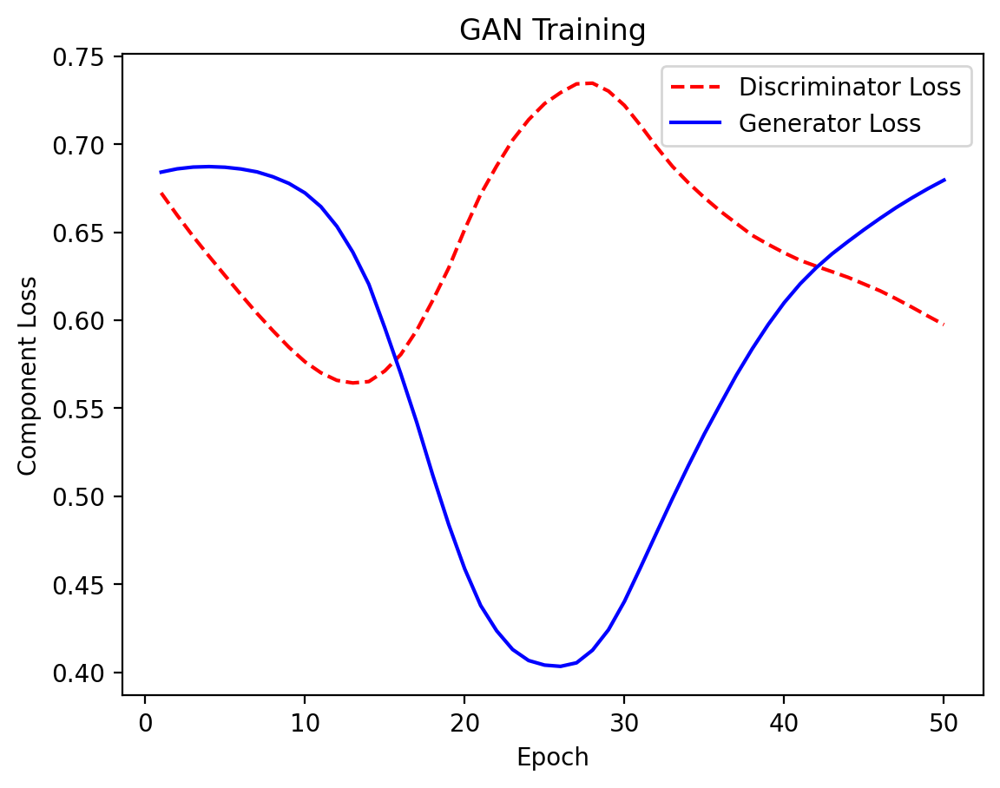

In [ ]:
gan_model_tr = gan_tr.train(generator=generator, discriminator=descriminator, gan=gan_model_tr)

## Music Element Prediction - Treble

In [ ]:
pred_tr = gan_model_tr.predict(test_tr)

1/1 [==============================] - 0s 38ms/step


In [ ]:
pred_tr.shape

(1, 100, 152)

## Model Training - Bass

In [ ]:
gan_bs = Gan(train_bs_transformed)
generator = gan_bs._generator(num_notes_bs,duration_bs)
descriminator = gan_bs._discriminator()
gan_model_bs = gan_bs._GAN(generator=generator, discriminator=descriminator)

55/55 [==============================] - 1s 11ms/step
>1, d1=0.672, d2=0.694
55/55 [==============================] - 1s 19ms/step
>2, d1=0.662, d2=0.698
55/55 [==============================] - 1s 11ms/step
>3, d1=0.653, d2=0.701
55/55 [==============================] - 1s 11ms/step
>4, d1=0.643, d2=0.704
55/55 [==============================] - 1s 19ms/step
>5, d1=0.633, d2=0.706
55/55 [==============================] - 1s 12ms/step
>6, d1=0.623, d2=0.707
55/55 [==============================] - 1s 12ms/step
>7, d1=0.613, d2=0.708
55/55 [==============================] - 1s 14ms/step
>8, d1=0.604, d2=0.708
55/55 [==============================] - 1s 11ms/step
>9, d1=0.595, d2=0.706
55/55 [==============================] - 1s 12ms/step
>10, d1=0.588, d2=0.701
55/55 [==============================] - 1s 14ms/step
>11, d1=0.582, d2=0.695
55/55 [==============================] - 1s 18ms/step
>12, d1=0.578, d2=0.684
55/55 [==============================] - 1s 15ms/step
>13, d1=0.576, d2=0

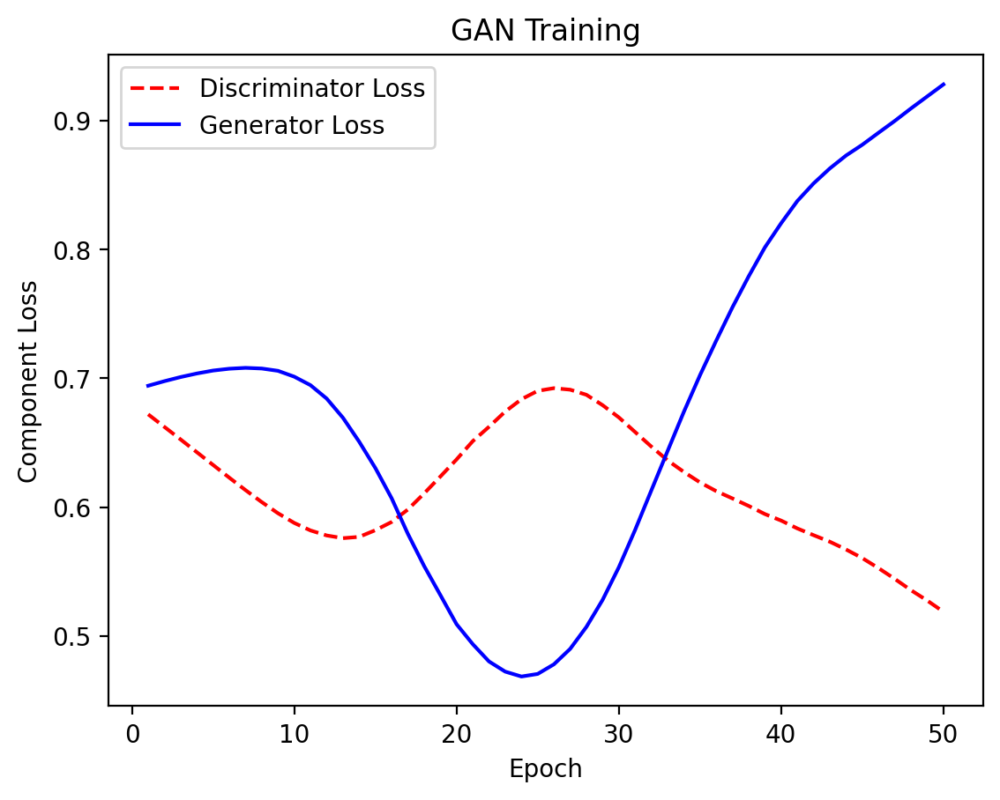

In [ ]:
gan_model_bs = gan_bs.train(generator=generator, discriminator=descriminator, gan=gan_model_bs)

## Music Element Prediction - Bass

In [ ]:
pred_bs = gan_model_bs.predict(test_bs)

1/1 [==============================] - 0s 28ms/step


# Features Splitting - Treble

In [ ]:
pred_note_tr = []
pred_dur_tr = []

for i in pred_tr[0]:
    pred_note_tr.append(i[:num_notes_tr])
    pred_dur_tr.append(i[num_notes_tr:])

In [ ]:
pred_note_tr = np.array(pred_note_tr)
pred_dur_tr = np.array(pred_dur_tr)

split the predicted music element into notes and durations.

# Features Splitting - Treble

In [ ]:
pred_note_bs = []
pred_dur_bs = []

for i in pred_bs[0]:
    pred_note_bs.append(i[:num_notes_bs])
    pred_dur_bs.append(i[num_notes_bs:])

In [ ]:
pred_note_bs = np.array(pred_note_bs)
pred_dur_bs = np.array(pred_dur_bs)

split the predicted music element into notes and durations.

# Music Generation

## Top K sampling

In [ ]:
def processing_ouputGAN(predicted_notes, predicted_duration, sequence_length):
  p_element, i_element = tf.math.top_k(predicted_notes,k=10)
  p_duration, i_duration = tf.math.top_k(predicted_duration,k=5)

  p_element = p_element.numpy()
  p_duration = p_duration.numpy()
  i_element = i_element.numpy()
  i_duration = i_duration.numpy()

  generated_notes = []
  generated_durations = []

  for i in range(sequence_length):
    p_element[i] /= p_element[i].sum()
    p_duration[i] /= p_duration[i].sum()

    p_element[i][-1] = 1 - np.sum(p_element[i][0:-1])
    element = np.random.choice(i_element[i], 1, p=p_element[i] )
    generated_notes.append(element[0])

    p_duration[i][-1] = 1 - np.sum(p_duration[i][0:-1])
    duration = np.random.choice(i_duration[i], 1, p=p_duration[i] )
    generated_durations.append(duration[0])

  generated_music_df = pd.DataFrame(list(zip(generated_notes, generated_durations)), columns =['music_element', 'duration'])

  return generated_music_df

function above is for top k sampling.

## Dataframe Construction - Treble

In [ ]:
generated_tr_gan = processing_ouputGAN(pred_note_tr, pred_dur_tr, sequence_length)

In [ ]:
generated_tr_gan

,music_element,duration
0,91,7
1,91,12
2,107,16
3,122,22
4,97,16
...,...,...
95,126,18
96,97,20
97,116,18
98,126,18


## Inverse Label Encoding - Treble

In [ ]:
generated_tr_gan['music_element'] = label_encoder_chord_tr.inverse_transform(generated_tr_gan['music_element'])
generated_tr_gan['duration']= label_encoder_duration_tr.inverse_transform(generated_tr_gan['duration'])

## Inverse Transformation - Treble

In [ ]:
for element_str, element_lst in chords_dict_tr.items():
  generated_tr_gan['music_element'] = generated_tr_gan['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_tr.items():
  generated_tr_gan['duration'] = generated_tr_gan['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
generated_tr_gan

,music_element,duration
0,D3,2.500000
1,D3,0.250000
2,F#4,5.750000
3,G3,0.666667
4,E-4,5.750000
...,...,...
95,rest,0.333333
96,E-4,0.500000
97,G#2,0.333333
98,rest,0.333333


## Dataframe Construction - Bass

In [ ]:
generated_bs_gan = processing_ouputGAN(pred_note_bs, pred_dur_bs, sequence_length)

In [ ]:
generated_bs_gan

,music_element,duration
0,2,3
1,59,8
2,2,7
3,99,13
4,6,6
...,...,...
95,15,11
96,15,0
97,2,3
98,125,8


## Inverse Label Encoding - Bass

In [ ]:
generated_bs_gan['music_element'] = label_encoder_chord_bs.inverse_transform(generated_bs_gan['music_element'])
generated_bs_gan['duration']= label_encoder_duration_bs.inverse_transform(generated_bs_gan['duration'])

## Inverse Transformation - Bass

In [ ]:
for element_str, element_lst in chords_dict_bs.items():
  generated_bs_gan['music_element'] = generated_bs_gan['music_element'].apply(lambda x: element_lst if x == element_str else x)

for duration_str, duration_lst in duration_dict_bs.items():
  generated_bs_gan['duration'] = generated_bs_gan['duration'].apply(lambda x: duration_lst if x == duration_str else x)

In [ ]:
generated_bs_gan

,music_element,duration
0,A1,3.000000
1,"[E-2, B-2]",0.500000
2,A1,0.333333
3,D2,2.000000
4,B-1,0.250000
...,...,...
95,C#2,0.750000
96,C#2,0.083333
97,A1,3.000000
98,G2,0.500000


## Music Score and Stream Initialization

In [ ]:
main_stream = stream.Score(id='mainScore')
stream_part1 = stream.Part(id='Part1')
stream_part2 = stream.Part(id='Part2')
instrument1 = instrument.Piano()
clef1 = clef.TrebleClef()
clef2 = clef.BassClef()
tempos = tm2 = tempo.MetronomeMark(number=90)
keys = key.Key(pitch.Pitch('B-'))
time_signature = meter.TimeSignature('4/4')
key_order = ['music_element', 'duration']

## Music Stream Construction

In [ ]:
def music_generation_part(stream_part, instrument, clef, tempo, key, time_signature, set_element):

  for i in [instrument, clef, tempo, key, time_signature]:
    stream_part.append(i)

  for notes, durations in zip(set_element[key_order[0]],set_element[key_order[1]]):
    note_name = None

    if type(notes) != list:

      if notes != 'rest':
        note_name = note.Note(notes)
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

      elif notes == 'rest':
        note_name = note.Rest()
        note_name.duration.quarterLength = durations
        stream_part.append(note_name)

    elif type(notes) == list:
      note_name = chord.Chord(notes)
      note_name.duration.quarterLength = durations
      stream_part.append(note_name)

  return stream_part

Function above add and submit the generated treble and bass clef data into music stream.

In [ ]:
treble_generation_part_gan = music_generation_part(stream_part1, instrument1, clef1, tempos, keys, time_signature, generated_tr_gan)

In [ ]:
bass_generation_part_gan = music_generation_part(stream_part2, instrument1, clef1, tempos, keys, time_signature, generated_bs_gan)

## Music Streams Balancing

In [ ]:
def convert_to_float(frac_str):
    try:
        return float(frac_str)
    except ValueError:
        num, denom = frac_str.split('/')
        try:
            leading, num = num.split(' ')
            whole = float(leading)
        except ValueError:
            whole = 0
        frac = float(num) / float(denom)
        return whole - frac if whole < 0 else whole + frac

In [ ]:
for i in bass_generation_part_gan:
  if convert_to_float(i.offset) > convert_to_float(treble_generation_part_gan[-1].offset):
    bass_generation_part_gan.remove(i)

for i in treble_generation_part_gan:
  if convert_to_float(i.offset) > convert_to_float(bass_generation_part_gan[-1].offset):
    treble_generation_part_gan.remove(i)

Balancing both treble clef and bass clef generated data to make sure the length of both clef is the same. Noted that, eventhought both have similar sequence, the duration of the notes play importance role in stream length. Where longer duration causes stream length to be longer and vice versa.

## Music Score Construction

In [ ]:
def music_generation_main(main_score, stream_parts_list):
  for i in stream_parts_list:
    main_score.insert(0, i)

  return main_score

In [ ]:
music_generated_gan = music_generation_main(main_stream, [treble_generation_part_gan, bass_generation_part_gan])

Add the music stream of treble clef and bass clef to music score.

# Music Generated

In [ ]:
music_generated_gan.show('text')

{0.0} <music21.stream.Part Part1>
    {0.0} <music21.instrument.Piano 'Piano'>
    {0.0} <music21.clef.TrebleClef>
    {0.0} <music21.tempo.MetronomeMark maestoso Quarter=90>
    {0.0} <music21.key.Key of B- major>
    {0.0} <music21.meter.TimeSignature 4/4>
    {0.0} <music21.note.Note D>
    {2.5} <music21.note.Note D>
    {2.75} <music21.note.Note F#>
    {8.5} <music21.note.Note G>
    {9.1667} <music21.note.Note E->
    {14.9167} <music21.note.Note F#>
    {18.9167} <music21.note.Note G>
    {19.4167} <music21.note.Note A>
    {24.6667} <music21.note.Note G#>
    {25.0} <music21.note.Note G>
    {25.4167} <music21.note.Note D>
    {29.4167} <music21.note.Note G>
    {29.75} <music21.note.Rest dotted-half>
    {32.75} <music21.note.Note G#>
    {33.25} <music21.chord.Chord A4 B-3 C5 E4>
    {38.5} <music21.chord.Chord E4 C4>
    {42.5} <music21.note.Note G#>
    {48.25} <music21.note.Note G>
    {54.25} <music21.note.Note G#>
    {59.5} <music21.note.Note G>
    {65.5} <music21.not

## Music Sheet

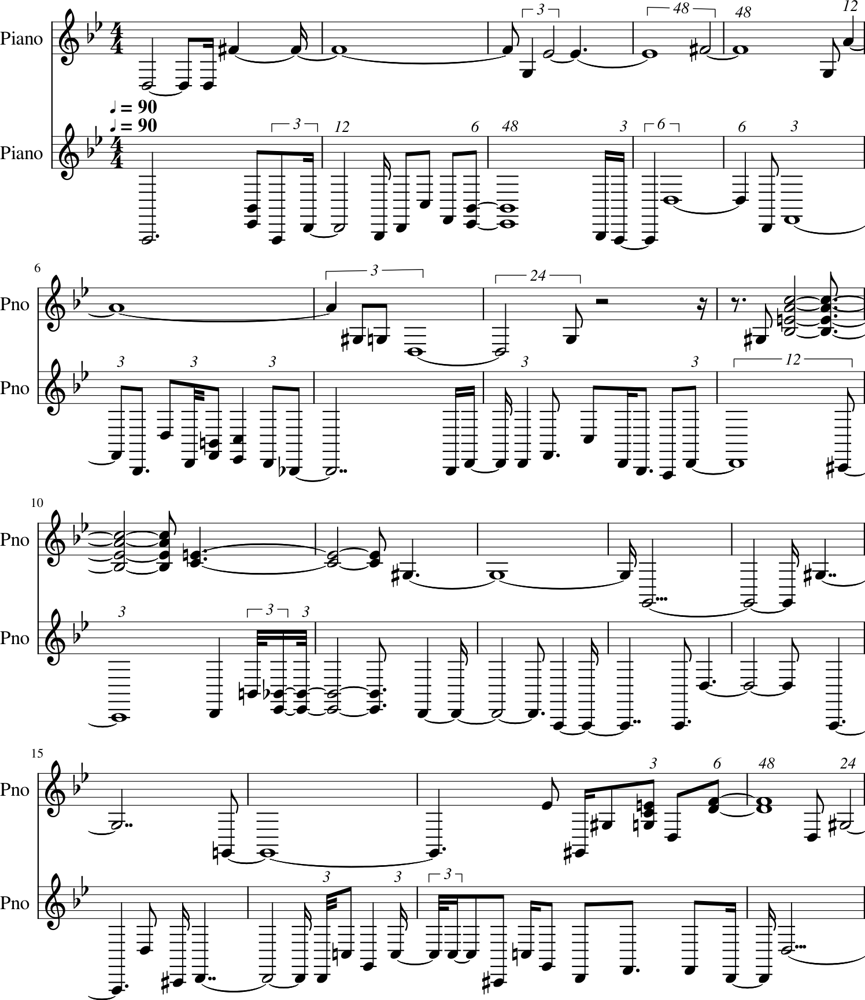

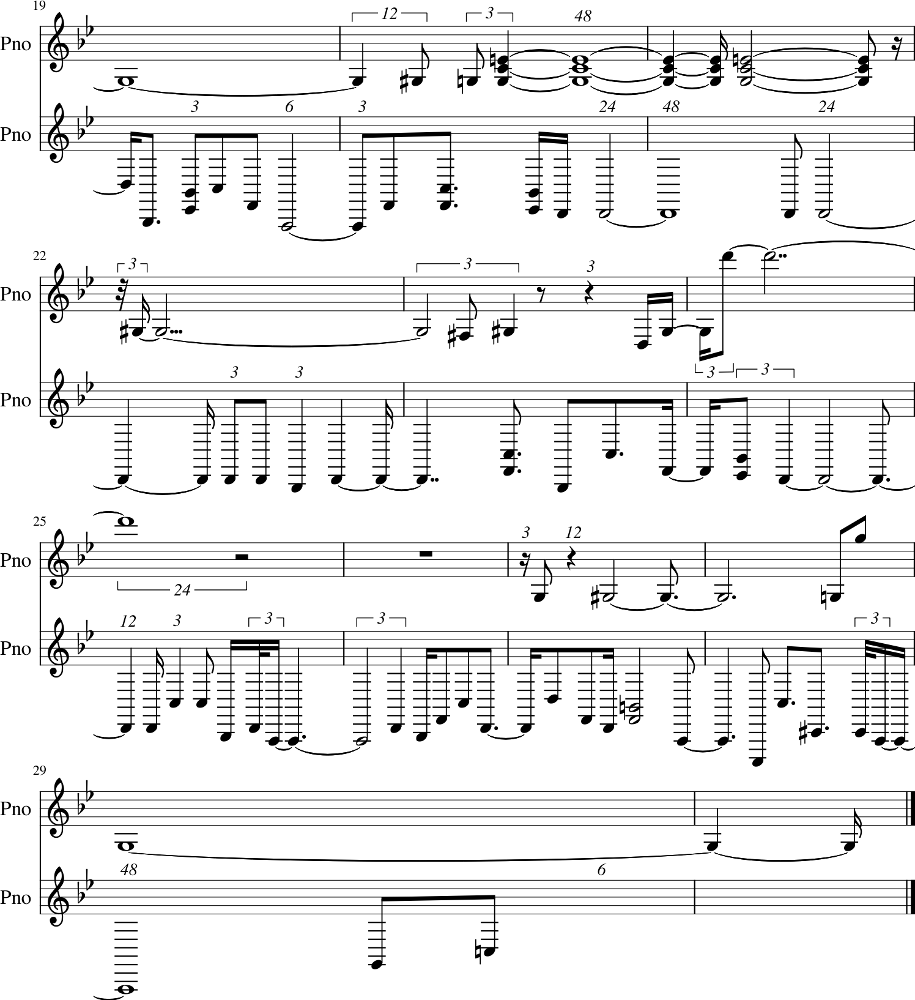

In [ ]:
music_generated_gan.show()

## Music Audio

In [ ]:
play(music_generated_gan)

# Save Model

In [ ]:
import pickle

path = "/content/drive/MyDrive/ClassicalMusic/ModelChopin/"
model_pkl_file = path + "MugenGAN_tr.pkl"

with open(model_pkl_file, 'wb') as file:
    pickle.dump(gan_model_tr, file)


In [ ]:
path = "/content/drive/MyDrive/ClassicalMusic/ModelChopin/"
model_pkl_file = path + "MugenGAN_bs.pkl"

with open(model_pkl_file, 'wb') as file:
    pickle.dump(gan_model_bs, file)
